In [1]:
import pandas as pd #import pandas library
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from scipy import signal
import numpy as np
from IPython.display import Audio
from librosa import feature, load

# Key finding from Audio

Before we dive into the math and code, let’s ask: **Why do we care about key detection in music?**

Key detection helps us:
- Identify the tonal center of a piece (i.e., Key Detection)
- Enable harmonic analysis or chord labeling.
- Aid music recommendation systems (e.g. matching similar keys).
- Assist in automatic transcription and genre analysis.
- Normalize or compare pieces across datasets.
- Useful for many plugins and softwares (e.g., DJ software, DAWs, etc.)

It's a fundamental part of **Music Information Retrieval (MIR)** and connects signal processing to human perception.




### Note Distributions and Key Profiles


In [2]:
# load default is sr=22050, and convert to mono = True
(x, fs) = load('../audio/JimHendrix_HeyJoe.wav') 
fs

22050

In [3]:
xn = x/np.abs(x.max()) #normalize
dur = len(xn)/fs
t = np.arange(0, dur, 1/(fs))/60 #time in minutes

Text(0.5, 0, 'Time in minutes')

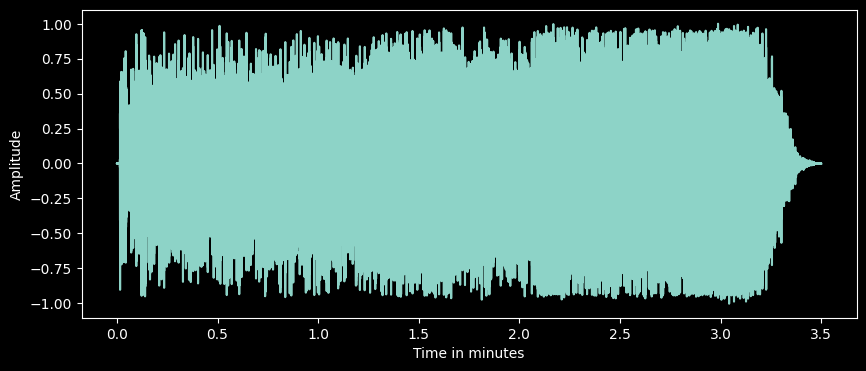

In [4]:
plt.figure(figsize=(10,4))
plt.plot(t, xn)
plt.ylabel('Amplitude')
plt.xlabel('Time in minutes')

In [5]:
Audio(xn, rate=fs)

### Key Finding Steps

##### 1) Create a Chromagram
Get chromagram for first 30 seconds of audio

In [6]:
chromagram = feature.chroma_stft(y = xn[:fs*30], n_fft=1024) #sr*15 = first fifteen seconds worth of samples
chromagram

array([[0.8871938 , 0.6309761 , 0.694506  , ..., 0.16595885, 0.30668756,
        0.20207907],
       [0.7609537 , 0.7900997 , 0.7135809 , ..., 0.26933166, 0.25786486,
        0.19942372],
       [1.        , 1.        , 1.        , ..., 0.5205043 , 0.37465933,
        0.37350702],
       ...,
       [0.56115365, 0.538445  , 0.47591063, ..., 0.14619395, 0.36361286,
        0.1232495 ],
       [0.68541765, 0.56999755, 0.9514441 , ..., 0.12136965, 0.2610467 ,
        0.11397581],
       [0.84691894, 0.6660048 , 0.9093805 , ..., 0.13269605, 0.36900404,
        0.23517868]], dtype=float32)

In [7]:
chromagram.shape

(12, 1292)

Recall that the chromagram will output a multidimensional array: here with 1292 time windows each with a vector of 12 values (one for the magnitude of each pitch class). The chromagram output vector is arranged from 0 to 12 where 0='C'

##### 2) Take the Mean Chroma values for each of the 12 bins

Text(0, 0.5, 'Energy')

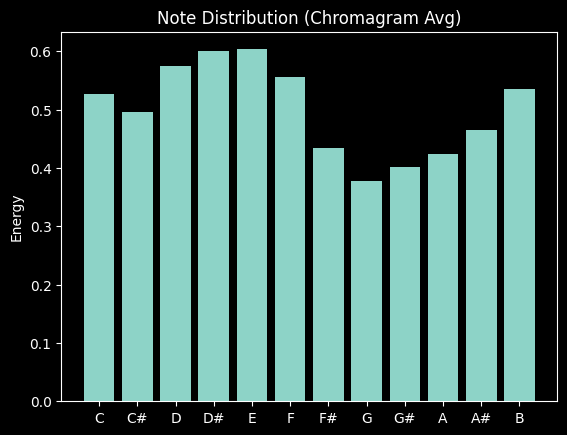

In [8]:
avg = chromagram.mean(axis=1)

scaledegs = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
plt.bar(scaledegs, avg)
plt.title("Note Distribution (Chromagram Avg)")
plt.ylabel("Energy")

### Segue: What do we compare our song's output to? (Enter: "Key Profiles")
The most common key-finding procedure is that chromagrams are computed from some file or excerpt, and each chromagram is evaluated against some kind of pitch class distributions (usually also called "key profiles" or "pitch class profiles" or "theoretical profiles" for all 24 musical (major-minor) keys. The one below has averaged all major and minor keys respectively and represents scale-degree rather than chroma.

#### Krumhansl-Kessler Key Profiles (i.e., "KK profiles")
Krumhansl and Kessler did a famous study in the 80s, and their profiles are still one of the most widely-used today. They are widely used because they are one of the only set of values  **based on human perception.**  

The basic idea was that, over several experiments, they asked people to rate how well a particular note "fit" following a particular cadential chord progression. The "profile" then, is the averaged ratings by chromatic scale degree (see below).

These profiles have been shown to be highly correlated with actual pitch class distributions for classical pieces. (I.e., if we count up all the notes in a Mozart sonata in C major, and report the distribution of scale-degrees as a proportion, the shape would look a lot like the profile on the left).

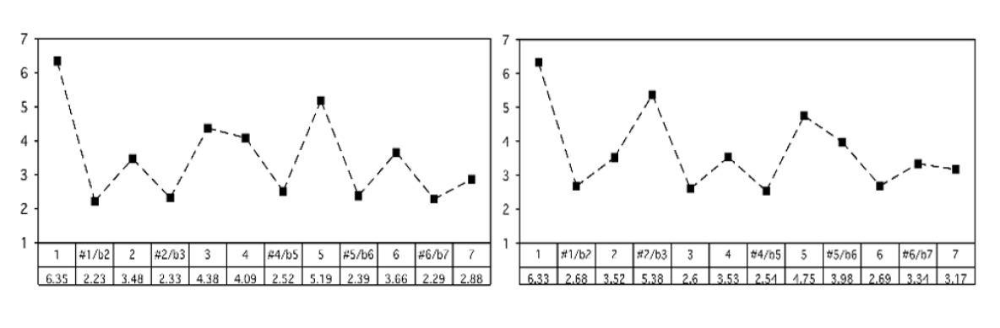

In [9]:
from IPython.display import Image
Image('../images/kk_profiles.png', embed=True)
#Major profile on left, Minor profile on right

In [10]:
#profile values by pitch class
#CMajor:
major_0 = np.array([6.35,2.23,3.48,2.33,4.38,4.09,2.52,5.19,2.39,3.66,2.29,2.88]) #values: C,C#,D,D#,...B
#CMinor:
minor_0 = np.array([6.33,2.68,3.52,5.38,2.60,3.53,2.54,4.75,3.98,2.69,3.34,3.17]) #values: C,C#,D,D#,...B

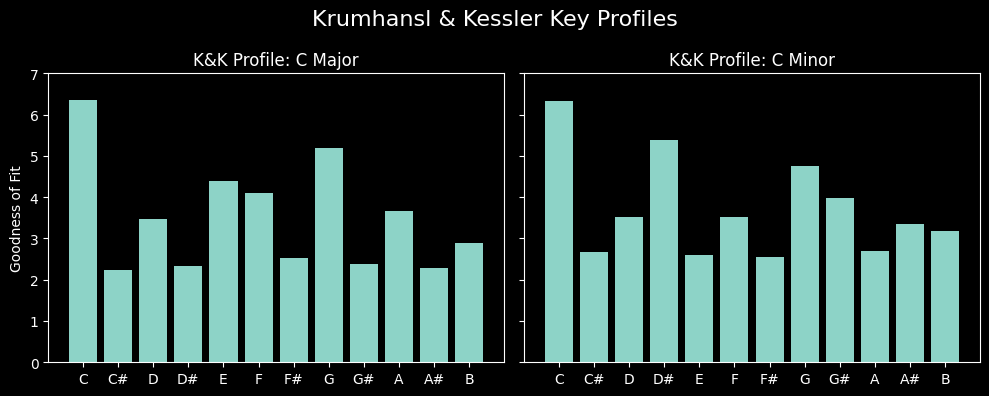

In [11]:
scaledegs = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']

fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

ax[0].bar(scaledegs, major_0)
ax[0].set_title("K&K Profile: C Major")
ax[0].set_ylim((0, 7))
ax[0].set_ylabel("Goodness of Fit")

ax[1].bar(scaledegs, minor_0)
ax[1].set_title("K&K Profile: C Minor")
ax[1].set_ylim((0, 7))

fig.suptitle("Krumhansl & Kessler Key Profiles", fontsize=16)
plt.tight_layout()
plt.show()

Notice that for chromatic notes we typically just show all sharps or all flats for simplicity, even though **they are enharmonic equivalents.** To get the "pitch class profile" values for every major key, we need to shift (or rotate) all the chromatic values by 1 semitone. (E.g., C# major will have "do" equal to "C#")

In [12]:
# Create a separate array (i.e. "profile") for every major and minor key
profiles_major = np.array(
    [np.roll(major_0, i) for i in range(12)]
)

profiles_minor = np.array(
    [np.roll(minor_0, i) for i in range(12)]
)

# stack the two arrays:
all_keys = np.vstack([profiles_major, profiles_minor])


In [13]:
# we can optionally name the keys for keeping track & later use:
key_order = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
key_labels = [i + " major" for i in scaledegs] + [i + " minor" for i in scaledegs]
key_labels


['C major',
 'C# major',
 'D major',
 'D# major',
 'E major',
 'F major',
 'F# major',
 'G major',
 'G# major',
 'A major',
 'A# major',
 'B major',
 'C minor',
 'C# minor',
 'D minor',
 'D# minor',
 'E minor',
 'F minor',
 'F# minor',
 'G minor',
 'G# minor',
 'A minor',
 'A# minor',
 'B minor']

Let's see a plot of a few so we see what we are doing:

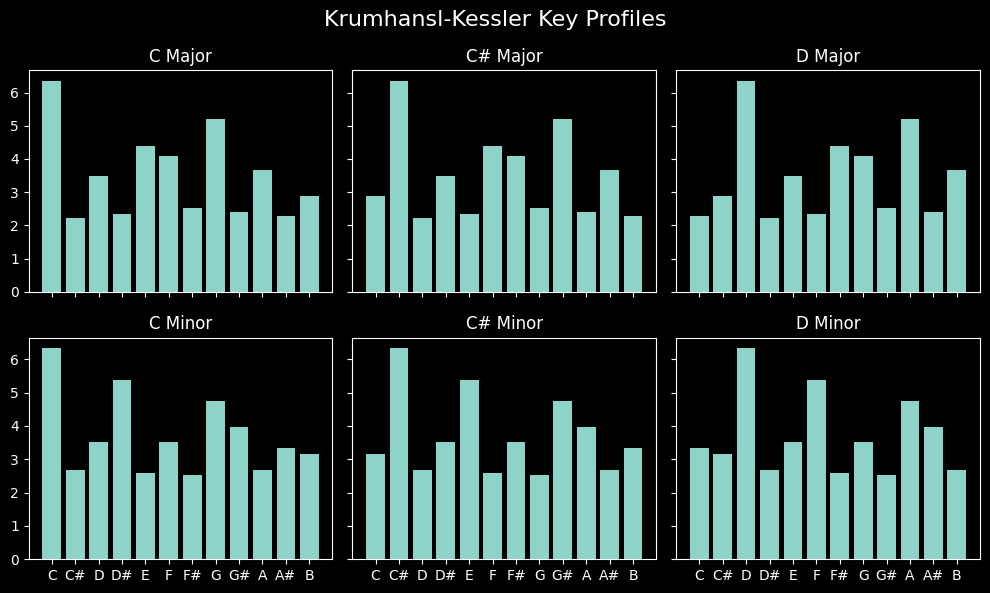

In [14]:
# Set up the figure to plot the profiles
fig, ax = plt.subplots(2, 3, sharex='col', sharey='row', figsize=(10,6))  # 2 rows and 6 columns


# Plot the major key profiles in the first row (indices 0 to 11)
for i in range(3):
    ax[0, i].bar(scaledegs, all_keys[i])  # Get the i-th major key profile (rows 0-11)
    ax[0, i].set_title(scaledegs[i] + " Major")

# Plot the minor key profiles in the second row (indices 12 to 23)
for i in range(3):
    ax[1, i].bar(scaledegs, all_keys[i + 12])  # Get the i-th minor key profile (rows 12-23)
    ax[1, i].set_title(scaledegs[i] + " Minor")

# Add title and adjust layout for subplots
fig.suptitle('Krumhansl-Kessler Key Profiles', fontsize=16)
plt.tight_layout()  

##### 3) Compute correlation between song's average chroma & each key "profile" looking for maximum positive correlation

By creating a separate array for each possible major scale, we can then take the values we have computed from our chromagrams and calculate correlations with each of the 24 profiles to estimate which one is the best match.

Since `all_keys` is a 24x12 matrix (24 keys, each with 12 values representing the pitch classes), we can compute the correlation between the averaged chromagram (`avg` object) and each key profile using vectorized operations, where our object gets compared to each key (row) of the matrix one at a time:

<BarContainer object of 12 artists>

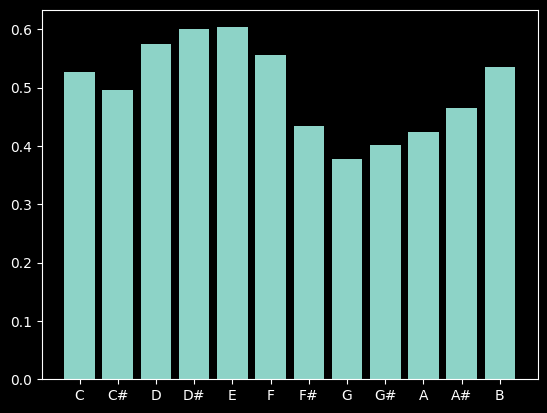

In [15]:
#Recall that our file's average chroma looked like this:
plt.bar(scaledegs, avg)

In [16]:
#Compute correlation between these values and each possible vector from the array dictionary.
# recall how np.corrcoef gives 4 values; we therefore index, [0,1], to return the one value we want.
correlations = np.array([
    np.corrcoef(avg, row)[0, 1] for row in all_keys
])

for label, corr in zip(key_labels, correlations):
    print(label + ": " + str(round(corr, 3)))

C major: 0.055
C# major: -0.216
D major: -0.113
D# major: 0.002
E major: 0.131
F major: 0.097
F# major: -0.184
G major: -0.109
G# major: -0.052
A major: 0.044
A# major: 0.17
B major: 0.175
C minor: 0.094
C# minor: 0.045
D minor: 0.232
D# minor: 0.179
E minor: 0.148
F minor: -0.022
F# minor: -0.295
G minor: -0.278
G# minor: -0.063
A minor: 0.034
A# minor: -0.116
B minor: 0.041


The highest positive correlation is .22 for D minor, followed by Eb minor at ".18.
The problem is, humans don't really agree on the key for 'Hey Joe'. The song's chord progression follows an ascending circle-of-fifths using only major harmonies: CM - GM - DM - AM -EM.  Because it tends to cadence on E, people most commonly say the piece is in E major. 

The correlation with E major is 0.14, which is the fourth-best guess according to this simple model (E minor gets score of .16).

#### Another try

Compute the chromagram for "Eleanor Rigby" for the first 30 seconds

In [ ]:
(x, fs) = load('../audio/eleanorrigby.wav', sr=22050)

xnorm = x/np.abs(x.max())

In [ ]:
from IPython.display import Audio
Audio(xnorm, rate=fs)

In [ ]:
chromagram = feature.chroma_stft(y = xnorm[:30*fs], n_fft=2048) #first 30 seconds only
avg2 = chromagram.mean(axis=1)# Take average chromagram values for entire duration of clip (i.e. across rows)

correlations2 = np.array([
    np.corrcoef(avg2, row)[0, 1] for row in all_keys
])

for label, corr in zip(key_labels, correlations2):
    print(label + ": " + str(round(corr, 3)))

C major: 0.476
C# major: -0.579
D major: -0.039
D# major: -0.136
E major: 0.521
F major: -0.13
F# major: -0.38
G major: 0.509
G# major: -0.301
A major: -0.011
A# major: -0.274
B major: 0.343
C minor: 0.123
C# minor: -0.008
D minor: -0.264
D# minor: -0.263
E minor: 0.924
F minor: -0.192
F# minor: -0.406
G minor: -0.027
G# minor: 0.221
A minor: 0.209
A# minor: -0.597
B minor: 0.28


This piece has the highest positive correlation with E minor at .92, followed by E major at .51, followed by G major at .51.  Most people agree this piece is in E minor (though given the melody, it might better be described as in E dorian, which is the same as the natural minor with a raised 6th! Yet another problem for popular music...)

### Testing different systems

It is possible that we might get better results if we examined the *last* thirty seconds of a song (this would be especially true for classical music).

An alternative system might break down the song into several slices of, say, 10 to 30 seconds each and compute the average of the chromagram for that duration of time.  When there might be a "close tie" for first place, doing it this way would allow the comparison of multiple arrays of r values, and you could then examine the global average in comparison with the highest positive values across each array to examine how many times the highest average value of each time frame aligned with the global average.

In our activity we will try a few different approaches and compare output.

### Testing different possible key profiles
Here we examined only the relation between the chromagram data and the Krumhansl-Kessler profiles. These are strongly biased towards distributions in Western classical music. However, they are the only key profile values in use that are *psychologically collected*. There are other profiles based on the distributions of notes in various data collections that have been tested and may work *slightly* better on popular music. For instance, a profile by David Temperley has been known to do better for pop music.  There are many others, for instance...

In [ ]:
from music21 import analysis
a = analysis.discrete.KrumhanslSchmuckler() #These are the same ones we are already using. 
a.getWeights(weightType='major')

[6.35, 2.23, 3.48, 2.33, 4.38, 4.09, 2.52, 5.19, 2.39, 3.66, 2.29, 2.88]

In [ ]:
a = analysis.discrete.SimpleWeights() #Super simple weighting based on 3 categories: In triad (2), in diatonic collection (1) or chromatic (0)
a.getWeights(weightType='major')

[2, 0, 1, 0, 1, 1, 0, 2, 0, 1, 0, 1]

In [ ]:
a = analysis.discrete.TemperleyKostkaPayne()
a.getWeights(weightType='major')

[0.748, 0.06, 0.488, 0.082, 0.67, 0.46, 0.096, 0.715, 0.104, 0.366, 0.057, 0.4]

In [ ]:
a = analysis.discrete.AardenEssen()
a.getWeights(weightType='major')

[17.7661,
 0.145624,
 14.9265,
 0.160186,
 19.8049,
 11.3587,
 0.291248,
 22.062,
 0.145624,
 8.15494,
 0.232998,
 4.95122]

In [ ]:
a = analysis.discrete.BellmanBudge()
a.getWeights(weightType='major')

[16.8, 0.86, 12.95, 1.41, 13.49, 11.93, 1.25, 20.28, 1.8, 8.04, 0.62, 10.57]

#### Challenges
There are many reasons that automatic key detection is a non-trivial task for a computer. The biggest challenge for automatic key detection systems is that it can even be a challenging task for humans! For instance, when a piece has changes of the key (modulations) and/or many notes that are outside of the theoretical note distribution of the key, the order and timing of notes becomes very important.

Currently key detection works best for popular music that stays (mostly) within a single key for the duration of the piece, or music where the largest proportion of the song stays in one key. They also tend to work slightly better with a larger window for finer spectral resolution (e.g., fft size =~ 4096-8192) and a fairly large overlap of 50% or higher.

Chromagrams are typically generated with A=440 tuning, and so any recording that deviates from this will need to be adjusted. (See Librosa package details for how to do that!)

**Note: If we wanted to compare different key profiles, it would be wise to normalize each one first!**